In [1]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import sys
import tifffile

# Change this folder to where the cloned `caImageAnalysis` repository is
sys.path.insert(0, '/Users/elysiaye/caImageAnalysis')

# Set the base path to the arinel-et-al_2026 repository
arinel_repo_path = r'/Volumes/Kobi/DOI_animals_good'

from caImageAnalysis import BrukerFish
from caImageAnalysis.mesm import *

## Included in this notebook
0. Creating Necessary Files
1. Motion Correction
2. Cell Segmentation
3. Component Evaluation

This notebook runs the full pipeline from raw Bruker 2P data to finalized neuron ROIs: **(0)** set the experiment path and optionally combine/split raw frames; **(1.1)** motion correction with NoRMCorre (tune on one plane, then run on all); **(1.2)** cell segmentation with CNMF (same workflow); **(1.3)** component evaluation and cleanup (filter ROIs by position, peak fluorescence, and distance). Each main section can be re-entered by initializing `BrukerFish` and loading the Mesmerize batch, so you can skip earlier steps if data already exist.

# Change the exp_folder to the path of the experiment

Set `exp_folder` to your experiment directory and `n_planes` / `n_sequences` to match your acquisition. All downstream steps use this path.

In [5]:
exp_folder = fr'{arinel_repo_path}/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007'

n_planes = 11  # number of planes per ZSeries
n_sequences = 2  # number of sequences in the alignment gui

# 1.0 Creating Files from Raw Images

Set the experiment path and (if needed) combine raw Bruker sequences and split the volume into per-plane images. Only needed once per experiment; later you can jump to Motion Correction with the same `exp_folder`.

### Combine raw image frames and create a frametimes file for each of the sequences

Builds combined TIFFs and `frametimes` for each sequence. **Skip if you already ran this** for this experiment.

In [3]:
# Combine the raw image frames and create a frametimes file.
for i in range(n_sequences):
	
	# Initialize BrukerFish
	fish = BrukerFish(exp_folder, region=f'sequence_{i}')

	# Create a combined frametimes.txt and combined tif files
	fish.create_frametimes_txt(drop_frames=np.arange(n_planes).tolist())
	fish.combine_channel_images('Ch2', drop_frames=[0])

Batch exists. Loading batch.pickle


/Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that u

KeyboardInterrupt: 

### Combine sequences and split to planes

Merges all sequences into one dataset and splits the volume into one folder per plane (`img_stack_0`, `img_stack_1`, …). **Skip if already done.**

In [4]:
# Combine both imaging sequences into one dataset
regions = [f'sequence_{i}' for i in range(4)]
fish.combine_regions(regions, remove_region_files=True, file_prefix='sequence')
fish = BrukerFish(exp_folder, region='sequence')

# Split the raw volumetric image to individual planes
fish.split_bruker_volumes('Ch2')

/Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:407: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->time,key->block0_values] [items->Index(['time'], dtype='object')]

  plane_frametimes.to_hdf(os.path.join(plane_folder_path, 'frametimes.h5'), 'frametimes')


# 1.1 Motion Correction

Stabilize the movie with **NoRMCorre** (patch-based). You pick one plane, try parameter sets, run motion correction, inspect and save TIFFs, choose the best run, then run the same parameters on all planes.

### Initialize BrukerFish object for motion correction

Load the experiment so motion correction can see the split planes. **If you already ran "Combine sequences and split to planes", start here** to avoid re-running preprocessing.


In [3]:
# Initialize BrukerFish object for the combined sequence
# This is needed to access the split plane data for motion correction
fish = BrukerFish(exp_folder, region='sequence')

# Verify that the volumes have been split (check if data_paths['volumes'] exists)
if 'volumes' in fish.data_paths:
    print(f"✓ Found {len(fish.data_paths['volumes'])} planes ready for motion correction")
    print(f"  Available planes: {sorted(fish.data_paths['volumes'].keys(), key=int)}")
    
    # Check a sample plane to verify structure
    sample_plane = list(fish.data_paths['volumes'].keys())[0]
    if 'image' in fish.data_paths['volumes'][sample_plane]:
        print(f"✓ Plane {sample_plane} has image path: {fish.data_paths['volumes'][sample_plane]['image']}")
        
        # Check file size to estimate memory requirements
        from pathlib import Path
        img_path = Path(fish.data_paths['volumes'][sample_plane]['image'])
        if img_path.exists():
            file_size_gb = img_path.stat().st_size / (1024**3)
            print(f"  Sample plane file size: {file_size_gb:.2f} GB")
            print(f"  Estimated memory needed: ~{file_size_gb * 3:.2f} GB (for processing)")
    else:
        print(f"⚠ Warning: Plane {sample_plane} missing 'image' key in data_paths")
else:
    print("⚠ Warning: 'volumes' not found in data_paths. You may need to run Cell 5 first.")
    print("  Run: fish.split_bruker_volumes('Ch2')")

Batch exists. Loading batch.pickle


/Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:205: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 205 of the file /Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pa

✓ Found 11 planes ready for motion correction
  Available planes: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10']
✓ Plane 0 has image path: /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/img_stack_0/image.tif
  Sample plane file size: 1.96 GB
  Estimated memory needed: ~5.88 GB (for processing)


## Motion correction with NoRMCorre

NoRMCorre runs on a single plane first so you can tune parameters (strides, overlaps, max_shifts, etc.) before applying them to the full volume.

### Pick a plane to optimize movement correction

Choose which plane index to use for testing motion correction parameters (e.g. a plane with clear structure).

In [17]:
# Change this to the plane you want to test motion correction parameters on
plane = 5

### Motion correction parameters

Define the parameter grid (strides, overlaps, max_shifts, max_deviation_rigid). Multiple values create multiple runs for comparison.

In [18]:
# Set combination of values to try
strides = [160]  # start a new patch for pw-rigid motion correction every x pixels
overlaps = [60]  # overlap between patches (size of patch strides+overlaps)
max_shifts = [50]  # maximum allowed rigid shifts (in pixels)
max_deviation_rigid = [60]  # maximum shifts deviation allowed for patch with respect to rigid shifts

In [19]:
# Add the combination of parameters to a mes_df dataframe
img_path = fish.data_paths['volumes'][str(plane)]['image']
mes_df = add_mcorr(fish, [img_path], grid=True, 
                         strides=strides, 
                         overlaps=overlaps,
                         max_shifts=max_shifts,
                         max_deviation_rigid=max_deviation_rigid)

mes_df

Batch does not exist. Creating batch.pickle


,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_5,img_stack_5/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",None,2026-03-02T16:20:55,None,None,None,96ece080-7b0c-4e38-92f9-07ae8ccb34bf


In [20]:
# See the unique parameters between rows with the same item_name
diffs = mes_df.caiman.get_params_diffs(algo="mcorr", item_name=mes_df.iloc[0]["item_name"])
diffs

/var/folders/5s/q3x21d8j6jvcnr7nmcb5xkwr0000gn/T/ipykernel_94682/688498701.py:2: FutureWarning: You are trying to use the following experimental feature, this may change in the future without warning:
CaimanDataFrameExtensions.get_params_diffs
This feature is new and the might improve in the future

  diffs = mes_df.caiman.get_params_diffs(algo="mcorr", item_name=mes_df.iloc[0]["item_name"])


0    {}
Name: params, dtype: object

### Run motion correction with the given parameter space

Runs NoRMCorre for each parameter combination on the chosen plane and updates the Mesmerize batch. Reload from disk to see success/failure per row.

In [21]:
# Load mesmerize dataframe
mes_df = load_mesmerize(fish)

# Memory-efficient processing: run motion correction
# Note: This will process all parameter combinations for the selected plane
# If memory is an issue, reduce parameter combinations in Cell 12
print(f"Running motion correction for {len(mes_df)} parameter combinations...")

try:
    run_mesmerize(mes_df)
    mes_df = mes_df.caiman.reload_from_disk()
    
    # Check which runs were successful
    print("\nMotion correction results:")
    for idx, output in enumerate(mes_df.loc[:, 'outputs']):
        status = "✓ Success" if output.get('success', False) else "✗ Failed"
        print(f"  Row {idx}: {status}")
        if not output.get('success', False) and 'error' in output:
            print(f"    Error: {output.get('error', 'Unknown error')}")
except MemoryError:
    print("\n⚠ Memory error! Try:")
    print("  1. Reduce parameter combinations in Cell 12")
    print("  2. Process one plane at a time")
    print("  3. Close other applications")
    raise
except Exception as e:
    print(f"\n⚠ Error during motion correction: {e}")
    print("Check the error message above for details")
    raise

Batch exists. Loading batch.pickle
Running motion correction for 1 parameter combinations...
Running 96ece080-7b0c-4e38-92f9-07ae8ccb34bf with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/96ece080-7b0c-4e38-92f9-07ae8ccb34bf/96ece080-7b0c-4e38-92f9-07ae8ccb34bf-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/96ece080-7b0c-4e38-92f9-07ae8ccb34bf/96ece080-7b0c-4e38-92f9-07ae8ccb34bf-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/96ece080-7b0c-4e38-92f9-07ae8ccb34bf/96ece080-7b0c-4e38-92f9-07ae8ccb34bf-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volu

100%|██████████| 1/1 [00:08<00:00,  8.50s/it]


finished computing correlation image

Motion correction results:
  Row 0: ✓ Success


### Visualize outputs

Compare raw vs motion-corrected movies (and different parameter runs) in an interactive viewer.

In [ ]:
# Compare the raw image to motion corrected ones
mes_df = load_mesmerize(fish)
mcorr_iw = visualize_mesmerize(mes_df, 'mcorr')
mcorr_iw.show()

Batch exists. Loading batch.pickle
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_7_20250924/mesmerize-batch/e6920d01-6ea7-4a0b-8c16-df42461f0b30/e6920d01-6ea7-4a0b-8c16-df42461f0b30-image_els__d1_640_d2_1024_d3_1_order_F_frames_1586.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_7_20250924/mesmerize-batch/ef4e1ad1-eb4c-4c73-a073-ef0e10e767df/ef4e1ad1-eb4c-4c73-a073-ef0e10e767df-image_els__d1_640_d2_1024_d3_1_order_F_frames_1586.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_7_20250924/mesmerize-batch/c1645f4f-f487-42f7-81b2-9210c0b80469/c1645f4f-f487-42f7-81b2-9210c0b80469-image_els__d1_640_d2_1024_d3_1_order_F_frames_1586.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_7_20250924/mesmerize-batch/d38d8a6f-30bc-4196-a363-272ec6376303/d38d8a6f-30bc-4196-a363-272ec6376303-image_els__d1_640_d2_1024_d3_1_order_F_frames_1586.mmap
D

RFBOutputContext()

In [ ]:
mcorr_iw.plot.canvas.close()

### Save motion correction outputs as TIFF files for viewing in Fiji

Export motion-corrected movies as TIFFs into an output folder so you can inspect them in Fiji (or another viewer).

In [10]:
# Save all motion correction outputs as TIFF files
# This allows you to view and compare different parameter combinations in Fiji

from pathlib import Path
import caiman as cm

# Create output directory for TIFF files
output_dir = Path(exp_folder) / 'mcorr_tiff_outputs'
output_dir.mkdir(exist_ok=True)

# Load mesmerize dataframe and reload from disk to ensure outputs are available
mes_df = load_mesmerize(fish)
mes_df = mes_df.caiman.reload_from_disk()

# Filter for motion correction results only
mcorr_df = mes_df[mes_df.algo == 'mcorr']

print(f"Saving {len(mcorr_df)} motion correction outputs as TIFF files...")

for idx, row in mcorr_df.iterrows():
    # Check if motion correction was successful
    if row['outputs'] is not None and row['outputs'].get('success', False):
        try:
            # Build param_str first to check if we already have this output (same plane + params; idx may differ)
            params = row['params']['main']
            param_str = f"strides{params.get('strides', 'N/A')}_overlaps{params.get('overlaps', 'N/A')}_maxshifts{params.get('max_shifts', 'N/A')}_maxdev{params.get('max_deviation_rigid', 'N/A')}"
            existing = list(output_dir.glob(f"mcorr_plane{plane}_idx*_{param_str}.tif"))
            if existing:
                print(f"Skipped (already exists): {existing[0].name}")
                continue

            # Get the motion-corrected movie from the output path
            # The motion-corrected movie is stored as a memory-mapped file
            output_path_mmap = row['outputs'].get('mcorr-output-path')
            if output_path_mmap is not None:
                # Construct the full path to the mmap file
                batch_path = Path(exp_folder) / 'mesmerize-batch' / output_path_mmap
                if batch_path.exists():
                    # Load the motion-corrected movie using caiman
                    mcorr_movie = cm.load(str(batch_path))
                    # Convert to numpy array
                    movie_array = np.array(mcorr_movie)
                else:
                    print(f"Warning: Could not find movie file for row {idx} at {batch_path}")
                    continue
            else:
                print(f"Warning: No output path found for row {idx}")
                continue

            filename = f"mcorr_plane{plane}_idx{idx}_{param_str}.tif"
            output_path = output_dir / filename

            # Save as TIFF
            tifffile.imwrite(str(output_path), movie_array)
            print(f"Saved: {filename}")
            
        except Exception as e:
            print(f"Error saving row {idx}: {e}")

print(f"\nAll TIFF files saved to: {output_dir}")

Batch exists. Loading batch.pickle
Saving 18 motion correction outputs as TIFF files...
Skipped (already exists): mcorr_plane5_idx0_strides(160, 160)_overlaps(60, 60)_maxshifts(40, 40)_maxdev10.tif
Skipped (already exists): mcorr_plane5_idx1_strides(160, 160)_overlaps(60, 60)_maxshifts(40, 40)_maxdev50.tif
Skipped (already exists): mcorr_plane5_idx2_strides(160, 160)_overlaps(60, 60)_maxshifts(40, 40)_maxdev90.tif
Skipped (already exists): mcorr_plane5_idx3_strides(160, 160)_overlaps(60, 60)_maxshifts(50, 50)_maxdev10.tif
Skipped (already exists): mcorr_plane5_idx4_strides(160, 160)_overlaps(60, 60)_maxshifts(50, 50)_maxdev50.tif
Skipped (already exists): mcorr_plane5_idx5_strides(160, 160)_overlaps(60, 60)_maxshifts(50, 50)_maxdev90.tif
Skipped (already exists): mcorr_plane5_idx6_strides(160, 160)_overlaps(60, 60)_maxshifts(30, 30)_maxdev30.tif
Skipped (already exists): mcorr_plane5_idx7_strides(160, 160)_overlaps(60, 60)_maxshifts(30, 30)_maxdev70.tif
Skipped (already exists): mcorr_

### Choose an index with the best parameters

Set `indices` to the row index(es) of the motion correction run(s) you want to keep. All other mcorr rows are removed from the batch.

In [19]:
# Change the row index here that you want to keep
# If you want to delete all rows to start over, keep the list empty
indices = [0]

In [20]:
# Removes every row except for the chosen index in the indices list
df = load_mesmerize(fish)
mes_df = clean_mesmerize(df, indices)  
mes_df

Batch exists. Loading batch.pickle


/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/mesmerize_core/caiman_extensions/common.py:220: FutureWarning: You are trying to use the following experimental feature, this may change in the future without warning:
CaimanDataFrameExtensions.get_children
This feature will change in the future and directly return the  a DataFrame of children (rows, ie. child batch items row) instead of a list of UUIDs

  children = self.get_children(index)


DependencyError: This batch item's output is used as the input for batch items with the following UUIDs:
['6e01a9d9-dcf1-4204-b434-49aca75fefac']
If you still want to force removal of this batch item use `safe_removal=False`

### Run motion correction on all planes

Add every other plane to the batch with the same parameters as the chosen run, then run motion correction on those planes (already-done planes are skipped).

In [24]:
# Adds every other plane in the volume with the same parameters as the leftover, chosen index
fish.process_mesmerize_filestructure()
mes_df = add_volume(fish, algo='mcorr')  
mes_df

Batch exists. Loading batch.pickle
Batch exists. Loading batch.pickle
Batch exists. Loading batch.pickle

,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_5,img_stack_5/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 96ece080-7b0c-4e38-92...,2026-03-02T16:20:55,2026-03-02T16:25:55,296.92 sec,None,96ece080-7b0c-4e38-92f9-07ae8ccb34bf
1,mcorr,img_stack_0,img_stack_0/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",None,2026-03-02T16:25:55,None,None,None,d16f032c-21f7-4633-99ad-fa7a83b69ff5
2,mcorr,img_stack_1,img_stack_1/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",None,2026-03-02T16:25:55,None,None,None,932633b6-34ad-49ac-bf27-76a2e72906e3
3,mcorr,img_stack_2,img_stack_2/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",None,2026-03-02T16:25:55,None,None,None,18bba3c6-4d88-4227-a5ea-5c0813feb0f5
4,mcorr,img_stack_3,img_stack_3/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",None,2026-03-02T16:25:55,None,None,None,6c7e4b03-a874-4e52-a5f5-b28706715928
5,mcorr,img_stack_4,img_stack_4/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",None,2026-03-02T16:25:55,None,None,None,741c7d8f-0174-45d9-8a19-d3ffffb16c0d
6,mcorr,img_stack_6,img_stack_6/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",None,2026-03-02T16:25:55,None,None,None,b32a0560-087b-46b6-b1af-2c40dbdec8c3
7,mcorr,img_stack_7,img_stack_7/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",None,2026-03-02T16:25:55,None,None,None,163e2742-0030-40e8-bba5-542f4bc59e6a
8,mcorr,img_stack_8,img_stack_8/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",None,2026-03-02T16:25:55,None,None,None,ff262803-9a6f-4f92-ae4b-2f0cb7be79bb
9,mcorr,img_stack_9,img_stack_9/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",None,2026-03-02T16:25:55,None,None,None,8b846839-0299-474c-93a6-14b5ca47d0f4


Run mesmerize on the entire volume. Note that this will detect the planes (i.e. the plane used to test parameters) that have already been motion corrected using the chosen parameter space and only run motion correction on the remaining planes. This is to save time. 

In [25]:
# Run mesmerize on the entire volume

# Check which planes already have successful results
print("Checking for already-processed planes...")
mes_df = load_mesmerize(fish)
already_processed = []
needs_processing = []

for idx, row in mes_df.iterrows():
    if row['algo'] == 'mcorr':
        outputs = row.get('outputs', {})
        if outputs and outputs.get('success', False):
            already_processed.append((idx, row.get('item_name', 'unknown')))
        else:
            needs_processing.append((idx, row.get('item_name', 'unknown')))

print(f"\nAlready processed: {len(already_processed)} planes")
if already_processed:
    print("  These will be skipped:")
    for idx, name in already_processed[:5]:  # Show first 5
        print(f"    - {name}")
    if len(already_processed) > 5:
        print(f"    ... and {len(already_processed) - 5} more")

print(f"\nNeeds processing: {len(needs_processing)} planes")
if needs_processing:
    print("  These will be processed:")
    for idx, name in needs_processing[:5]:  # Show first 5
        print(f"    - {name}")
    if len(needs_processing) > 5:
        print(f"    ... and {len(needs_processing) - 5} more")

print(f"\n{'='*60}")
print(f"Running motion correction for {len(needs_processing)} planes...")
print("This may take a while and use significant memory...")
print(f"{'='*60}")

try:
    run_mesmerize(mes_df)
    mes_df = mes_df.caiman.reload_from_disk()
    
    # Check which runs were successful
    print("\nMotion correction results:")
    success_count = 0
    failed_count = 0
    skipped_count = 0
    
    for idx, row in mes_df.iterrows():
        if row['algo'] == 'mcorr':
            output = row.get('outputs', {})
            if output and output.get('success', False):
                success_count += 1
            elif output is None or not output:
                skipped_count += 1
            else:
                failed_count += 1
                print(f"  Row {idx} ({row.get('item_name', 'unknown')}): Failed")
                if 'error' in output:
                    print(f"    Error: {output.get('error', 'Unknown')}")
    
    print(f"\n✓ Successfully processed: {success_count} planes")
    if skipped_count > 0:
        print(f"  Skipped (already processed): {skipped_count} planes")
    if failed_count > 0:
        print(f"  Failed: {failed_count} planes")
    
except MemoryError:
    print("\n⚠ Memory error! Use the batch processing alternative below.")
    raise
except Exception as e:
    print(f"\n⚠ Error: {e}")
    raise

Checking for already-processed planes...
Batch exists. Loading batch.pickle

Already processed: 1 planes
  These will be skipped:
    - img_stack_5

Needs processing: 10 planes
  These will be processed:
    - img_stack_0
    - img_stack_1
    - img_stack_2
    - img_stack_3
    - img_stack_4
    ... and 5 more

Running motion correction for 10 planes...
This may take a while and use significant memory...
Running d16f032c-21f7-4633-99ad-fa7a83b69ff5 with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/d16f032c-21f7-4633-99ad-fa7a83b69ff5/d16f032c-21f7-4633-99ad-fa7a83b69ff5-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/d16f032c-21f7-4633-99ad-fa7a83b69ff5/d16f032c-21f7-4633-99ad-fa7a83b69ff5-image_els

100%|██████████| 1/1 [00:05<00:00,  5.15s/it]


finished computing correlation image
Running 932633b6-34ad-49ac-bf27-76a2e72906e3 with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/932633b6-34ad-49ac-bf27-76a2e72906e3/932633b6-34ad-49ac-bf27-76a2e72906e3-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/932633b6-34ad-49ac-bf27-76a2e72906e3/932633b6-34ad-49ac-bf27-76a2e72906e3-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/932633b6-34ad-49ac-bf27-76a2e72906e3/932633b6-34ad-49ac-bf27-76a2e72906e3-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ug

100%|██████████| 1/1 [00:05<00:00,  5.23s/it]


finished computing correlation image
Running 18bba3c6-4d88-4227-a5ea-5c0813feb0f5 with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/18bba3c6-4d88-4227-a5ea-5c0813feb0f5/18bba3c6-4d88-4227-a5ea-5c0813feb0f5-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/18bba3c6-4d88-4227-a5ea-5c0813feb0f5/18bba3c6-4d88-4227-a5ea-5c0813feb0f5-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/18bba3c6-4d88-4227-a5ea-5c0813feb0f5/18bba3c6-4d88-4227-a5ea-5c0813feb0f5-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ug

100%|██████████| 1/1 [00:04<00:00,  4.95s/it]


finished computing correlation image
Running 6c7e4b03-a874-4e52-a5f5-b28706715928 with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/6c7e4b03-a874-4e52-a5f5-b28706715928/6c7e4b03-a874-4e52-a5f5-b28706715928-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/6c7e4b03-a874-4e52-a5f5-b28706715928/6c7e4b03-a874-4e52-a5f5-b28706715928-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/6c7e4b03-a874-4e52-a5f5-b28706715928/6c7e4b03-a874-4e52-a5f5-b28706715928-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ug

100%|██████████| 1/1 [00:08<00:00,  8.62s/it]


finished computing correlation image
Running 741c7d8f-0174-45d9-8a19-d3ffffb16c0d with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/741c7d8f-0174-45d9-8a19-d3ffffb16c0d/741c7d8f-0174-45d9-8a19-d3ffffb16c0d-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/741c7d8f-0174-45d9-8a19-d3ffffb16c0d/741c7d8f-0174-45d9-8a19-d3ffffb16c0d-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/741c7d8f-0174-45d9-8a19-d3ffffb16c0d/741c7d8f-0174-45d9-8a19-d3ffffb16c0d-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ug

100%|██████████| 1/1 [00:04<00:00,  4.75s/it]


finished computing correlation image
Running b32a0560-087b-46b6-b1af-2c40dbdec8c3 with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/b32a0560-087b-46b6-b1af-2c40dbdec8c3/b32a0560-087b-46b6-b1af-2c40dbdec8c3-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/b32a0560-087b-46b6-b1af-2c40dbdec8c3/b32a0560-087b-46b6-b1af-2c40dbdec8c3-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/b32a0560-087b-46b6-b1af-2c40dbdec8c3/b32a0560-087b-46b6-b1af-2c40dbdec8c3-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ug

100%|██████████| 1/1 [00:09<00:00,  9.69s/it]


finished computing correlation image
Running 163e2742-0030-40e8-bba5-542f4bc59e6a with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/163e2742-0030-40e8-bba5-542f4bc59e6a/163e2742-0030-40e8-bba5-542f4bc59e6a-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/163e2742-0030-40e8-bba5-542f4bc59e6a/163e2742-0030-40e8-bba5-542f4bc59e6a-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/163e2742-0030-40e8-bba5-542f4bc59e6a/163e2742-0030-40e8-bba5-542f4bc59e6a-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ug

100%|██████████| 1/1 [00:05<00:00,  5.02s/it]


finished computing correlation image
Running ff262803-9a6f-4f92-ae4b-2f0cb7be79bb with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/ff262803-9a6f-4f92-ae4b-2f0cb7be79bb/ff262803-9a6f-4f92-ae4b-2f0cb7be79bb-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/ff262803-9a6f-4f92-ae4b-2f0cb7be79bb/ff262803-9a6f-4f92-ae4b-2f0cb7be79bb-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/ff262803-9a6f-4f92-ae4b-2f0cb7be79bb/ff262803-9a6f-4f92-ae4b-2f0cb7be79bb-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ug

100%|██████████| 1/1 [00:14<00:00, 14.56s/it]


finished computing correlation image
Running 8b846839-0299-474c-93a6-14b5ca47d0f4 with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/8b846839-0299-474c-93a6-14b5ca47d0f4/8b846839-0299-474c-93a6-14b5ca47d0f4-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/8b846839-0299-474c-93a6-14b5ca47d0f4/8b846839-0299-474c-93a6-14b5ca47d0f4-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/8b846839-0299-474c-93a6-14b5ca47d0f4/8b846839-0299-474c-93a6-14b5ca47d0f4-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ug

100%|██████████| 1/1 [00:17<00:00, 17.48s/it]


finished computing correlation image
Running 31202062-7da0-437c-ada2-c771711ec99a with local backend
starting mc
mc finished successfully!
computing projections
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/31202062-7da0-437c-ada2-c771711ec99a/31202062-7da0-437c-ada2-c771711ec99a-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Computing correlation image
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/31202062-7da0-437c-ada2-c771711ec99a/31202062-7da0-437c-ada2-c771711ec99a-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/31202062-7da0-437c-ada2-c771711ec99a/31202062-7da0-437c-ada2-c771711ec99a-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ug

100%|██████████| 1/1 [00:05<00:00,  5.48s/it]


finished computing correlation image

Motion correction results:

✓ Successfully processed: 11 planes


### Save motion corrected planes as tiff files to view in Fiji (optional)

Optional: export motion-corrected movies for selected planes as TIFFs (e.g. for inspection in Fiji) after running motion correction on the full volume.

In [6]:
# Initialize BrukerFish for the combined sequence (for saving TIFFs and downstream steps)
# Run this after motion correction on the entire volume if you skipped earlier cells
fish = BrukerFish(exp_folder, region='sequence')

Batch exists. Loading batch.pickle


/Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:205: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 205 of the file /Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pa

In [8]:
# Save motion correction outputs as TIFF files for selected planes
# Choose which planes to save (you can omit the plane whose tiff file has already been saved)
# Planes are 0-indexed; use list(range(n_planes)) for all planes
planes_to_save = [2]

from pathlib import Path
import caiman as cm

output_dir = Path(exp_folder) / 'mcorr_tiff_outputs'
output_dir.mkdir(exist_ok=True)

mes_df = load_mesmerize(fish)
mes_df = mes_df.caiman.reload_from_disk()
mcorr_df = mes_df[mes_df.algo == 'mcorr']

# Build set of item_name to save (e.g. img_stack_0, img_stack_1, ...)
names_to_save = {f'img_stack_{p}' for p in planes_to_save}
saved_count = 0

for idx, row in mcorr_df.iterrows():
    if row['item_name'] not in names_to_save:
        continue
    if row['outputs'] is None or not row['outputs'].get('success', False):
        continue
    try:
        output_path_mmap = row['outputs'].get('mcorr-output-path')
        if output_path_mmap is None:
            continue
        batch_path = Path(exp_folder) / 'mesmerize-batch' / output_path_mmap
        if not batch_path.exists():
            print(f"Warning: Not found for {row['item_name']}: {batch_path}")
            continue
        mcorr_movie = cm.load(str(batch_path))
        movie_array = np.array(mcorr_movie)
        # Plane number from item_name (e.g. img_stack_3 -> 3)
        plane_num = int(row['item_name'].split('_')[-1])
        params = row['params']['main']
        param_str = f"strides{params.get('strides', 'N/A')}_overlaps{params.get('overlaps', 'N/A')}_maxshifts{params.get('max_shifts', 'N/A')}_maxdev{params.get('max_deviation_rigid', 'N/A')}"
        existing = list(output_dir.glob(f"mcorr_plane{plane_num}_idx*_{param_str}.tif"))
        if existing:
            print(f"Skipped (already exists): {existing[0].name}")
            continue
        filename = f"mcorr_plane{plane_num}_idx{idx}_{param_str}.tif"
        output_path = output_dir / filename
        tifffile.imwrite(str(output_path), movie_array)
        print(f"Saved: {filename}")
        saved_count += 1
    except Exception as e:
        print(f"Error saving {row['item_name']} (idx {idx}): {e}")

print(f"\nSaved {saved_count} TIFF(s) to: {output_dir}")

Batch exists. Loading batch.pickle
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mesmerize-batch/18bba3c6-4d88-4227-a5ea-5c0813feb0f5/18bba3c6-4d88-4227-a5ea-5c0813feb0f5-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Saved: mcorr_plane2_idx3_strides(160, 160)_overlaps(60, 60)_maxshifts(50, 50)_maxdev60.tif

Saved 1 TIFF(s) to: /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_31_20251007/mcorr_tiff_outputs


### Visualize outputs for all planes

In [5]:
# Visualize the motion corrected output of all planes
mes_df = load_mesmerize(fish)
mcorr_iw = visualize_mesmerize(mes_df, 'mcorr')
mcorr_iw.show()

Batch exists. Loading batch.pickle
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/mesmerize-batch/11bc8971-065d-4bac-be19-a594e6f1aefe/11bc8971-065d-4bac-be19-a594e6f1aefe-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/mesmerize-batch/1a515408-b1e7-430a-af0e-5eea916c3c59/1a515408-b1e7-430a-af0e-5eea916c3c59-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/mesmerize-batch/00ff7dc0-687e-459e-a8ba-d646c0fa5786/00ff7dc0-687e-459e-a8ba-d646c0fa5786-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/mesmerize-batch/0124b8df-1f13-4be9-b22d-0a8ea655296d/0124b8df-1f13-4be9-b22d-0a8ea655296d-image_els__d1_640_d2_1024_d3_1_order_F_frames_160

RFBOutputContext()

In [ ]:
mcorr_iw.plot.canvas.close()

# 1.2 Cell segmentation with CNMF

Extract neuronal ROIs with **CNMF** (CaImAn). Same workflow as motion correction: clean the batch to keep only mcorr results, pick one plane, add CNMF parameter sets, run, visualize, choose the best index, then run on all planes.

In [3]:
# Initialize BrukerFish
fish = BrukerFish(exp_folder, region='sequence')

Batch exists. Loading batch.pickle


/Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:205: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 205 of the file /Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pa

In [4]:
# Load the mesmerize dataframe
mes_df = load_mesmerize(fish)

Batch exists. Loading batch.pickle


In [5]:
mes_df

,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_5,img_stack_5/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': dde60ac7-207c-4736-89...,2026-01-22T17:22:33,2026-01-22T17:30:58,475.73 sec,None,dde60ac7-207c-4736-89f3-a79512d353a3
1,mcorr,img_stack_0,img_stack_0/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 5f905002-c07a-4e6a-b8...,2026-01-22T17:35:22,2026-01-22T17:46:04,619.55 sec,None,5f905002-c07a-4e6a-b8be-cd0e3b1b54ae
2,mcorr,img_stack_1,img_stack_1/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 7864b9ca-418d-48e7-a9...,2026-01-22T17:35:22,2026-01-22T19:27:58,369.78 sec,None,7864b9ca-418d-48e7-a994-ddf2569fa8d9
3,mcorr,img_stack_2,img_stack_2/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': c3dbfecb-e115-4fc2-80...,2026-01-22T17:35:22,2026-01-22T19:35:25,447.06 sec,None,c3dbfecb-e115-4fc2-80d3-058f22cefab6
4,mcorr,img_stack_3,img_stack_3/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 729ef087-3442-4c5d-bd...,2026-01-22T17:35:22,2026-01-22T19:41:55,389.57 sec,None,729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9
5,mcorr,img_stack_4,img_stack_4/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 866b610c-f2ec-4a9d-ab...,2026-01-22T17:35:22,2026-01-22T19:50:58,543.81 sec,None,866b610c-f2ec-4a9d-ab71-b5418a6515e3
6,mcorr,img_stack_6,img_stack_6/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 741d3ca7-cf59-4c86-b0...,2026-01-22T17:35:22,2026-01-22T19:56:06,307.44 sec,None,741d3ca7-cf59-4c86-b000-d206ec852407
7,mcorr,img_stack_7,img_stack_7/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': ad1c856e-2f6d-48bf-98...,2026-01-22T17:35:22,2026-01-22T20:01:19,312.65 sec,None,ad1c856e-2f6d-48bf-98ac-de2e4428c1d6
8,mcorr,img_stack_8,img_stack_8/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 8e3d0620-a3e0-48c7-aa...,2026-01-22T17:35:23,2026-01-22T20:10:55,575.9 sec,None,8e3d0620-a3e0-48c7-aae2-5bf774171767
9,mcorr,img_stack_9,img_stack_9/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 686509e4-c805-49a4-a5...,2026-01-22T17:35:23,2026-01-22T20:18:09,434.78 sec,None,686509e4-c805-49a4-a5e8-0958b7c8532e


Before adding CNMF runs: load the batch, then **clean** it so only motion-corrected planes remain (removes any old CNMF rows). This keeps the batch ready for CNMF on the mcorr outputs.

In [6]:
# Clean mes_df such that only the motion corrected planes are in the dataframe
clean_mesmerize(mes_df, [], keep_algo='mcorr')

,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_5,img_stack_5/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': dde60ac7-207c-4736-89...,2026-01-22T17:22:33,2026-01-22T17:30:58,475.73 sec,None,dde60ac7-207c-4736-89f3-a79512d353a3
1,mcorr,img_stack_0,img_stack_0/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 5f905002-c07a-4e6a-b8...,2026-01-22T17:35:22,2026-01-22T17:46:04,619.55 sec,None,5f905002-c07a-4e6a-b8be-cd0e3b1b54ae
2,mcorr,img_stack_1,img_stack_1/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 7864b9ca-418d-48e7-a9...,2026-01-22T17:35:22,2026-01-22T19:27:58,369.78 sec,None,7864b9ca-418d-48e7-a994-ddf2569fa8d9
3,mcorr,img_stack_2,img_stack_2/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': c3dbfecb-e115-4fc2-80...,2026-01-22T17:35:22,2026-01-22T19:35:25,447.06 sec,None,c3dbfecb-e115-4fc2-80d3-058f22cefab6
4,mcorr,img_stack_3,img_stack_3/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 729ef087-3442-4c5d-bd...,2026-01-22T17:35:22,2026-01-22T19:41:55,389.57 sec,None,729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9
5,mcorr,img_stack_4,img_stack_4/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 866b610c-f2ec-4a9d-ab...,2026-01-22T17:35:22,2026-01-22T19:50:58,543.81 sec,None,866b610c-f2ec-4a9d-ab71-b5418a6515e3
6,mcorr,img_stack_6,img_stack_6/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 741d3ca7-cf59-4c86-b0...,2026-01-22T17:35:22,2026-01-22T19:56:06,307.44 sec,None,741d3ca7-cf59-4c86-b000-d206ec852407
7,mcorr,img_stack_7,img_stack_7/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': ad1c856e-2f6d-48bf-98...,2026-01-22T17:35:22,2026-01-22T20:01:19,312.65 sec,None,ad1c856e-2f6d-48bf-98ac-de2e4428c1d6
8,mcorr,img_stack_8,img_stack_8/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 8e3d0620-a3e0-48c7-aa...,2026-01-22T17:35:23,2026-01-22T20:10:55,575.9 sec,None,8e3d0620-a3e0-48c7-aae2-5bf774171767
9,mcorr,img_stack_9,img_stack_9/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 686509e4-c805-49a4-a5...,2026-01-22T17:35:23,2026-01-22T20:18:09,434.78 sec,None,686509e4-c805-49a4-a5e8-0958b7c8532e


### Pick a plane to apply source extraction

Choose which plane to use for testing CNMF parameters. The row order in `mes_df` may differ from plane number; check `mes_df` to match index to plane.

In [7]:
# Change this to the plane you want to test CNMF parameters on 
# NOTE: the index in the fastplotlib is not equal to the plane number. To find out the plane, check mes_df at the row index
plane = 0

### CNMF parameters

Set the CNMF parameter grid (rf, stride, K, gSig, merge_thr, and quality thresholds rval_lowest, SNR_lowest, cnn_lowest, etc.). Multiple values per key create multiple runs for comparison.

In [8]:
# Set combination of values to try
rf = [25]  # half-size of the patches in pixels. e.g., if rf=25, patches are 50x50
stride = [10]  # amount of overlap between the patches in pixels
K = [18]  # number of components per patch
gSig = [5]  # expected half size of neurons in pixels

nb = [2]  # number of global background components
merge_thr = [0.999]  # merging threshold, max correlation allowed -> above this thresh, ROIs are merged together

rval_lowest = [0.0]  # minimum accepted space correlation
SNR_lowest = [1.5]  # minimum required trace SNR
cnn_lowest = [0.5]  # minimum required CNN threshold

rval_thr = [0.8]  # space correlation threshold
min_SNR = [2.0]  # signal to noise ratio for accepting a component
min_cnn_thr = [0.9]  # threshold for CNN based classifier

In [9]:
# Add the combination of parameters to a mes_df dataframe
img_path = fish.data_paths['volumes'][str(plane)]['mcorr']

mes_df = add_cnmf(fish, [img_path], grid=True, transient=1.5,
                  rf=rf,
                  stride=stride,
                  K=K, 
				  gSig=gSig,
                  nb=nb,
                  merge_thr=merge_thr,
                  rval_lowest=rval_lowest,
                  SNR_lowest=SNR_lowest,
				  cnn_lowest=cnn_lowest,
                  rval_thr=rval_thr,
                  min_SNR=min_SNR,
                  min_cnn_thr=min_cnn_thr)

Batch exists. Loading batch.pickle


In [10]:
# See the unique parameters between rows with the same item_name
diffs = mes_df.caiman.get_params_diffs(algo="cnmf", item_name=Path(img_path).parent.name)
diffs

/var/folders/5s/q3x21d8j6jvcnr7nmcb5xkwr0000gn/T/ipykernel_63445/1470305159.py:2: FutureWarning: You are trying to use the following experimental feature, this may change in the future without warning:
CaimanDataFrameExtensions.get_params_diffs
This feature is new and the might improve in the future

  diffs = mes_df.caiman.get_params_diffs(algo="cnmf", item_name=Path(img_path).parent.name)


11    {}
Name: params, dtype: object

### Run CNMF with the given parameter space

Runs CNMF for each parameter combination on the chosen plane. This can take a while; reload the batch from disk to check success per row.

In [11]:
# Run cell segmentation on the first plane
run_mesmerize(mes_df)
mes_df = mes_df.caiman.reload_from_disk()

Running 9b8285e0-8e3c-463e-ad15-428d3a6d45e0 with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                        5f905002-c07a-4e6a-b8be-cd0e3b1b54ae
input_movie_path    5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/5f905002-...
params              {'main': {'fr': 0.4684721862337262, 'p': 1, 'n...
outputs                                                          None
added_time                                        2026-03-07T13:32:24
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             9b8285e0-8e3c-463e-ad15-428d3a6d45e0
Name: 11, dtype: object
With params:{'main': {'fr': 0.4684721862337262, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 18, 

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/9b8285e0-8e3c-463e-ad15-428d3a6d45e0_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): /Users/elysiaye/caiman_data/model/cnn_model.json
  7/149 [>.............................] - ETA: 1s 

2026-03-07 13:40:50.242754: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


149/149 [==============================] - 1s 9ms/step


In [12]:
# See the rows that were successfully run
for output in mes_df.loc[:, 'outputs']:
    print(output['success'])

True
True
True
True
True
True
True
True
True
True
True
True


### Visualize outputs for each parameter combination

Compare CNMF outputs (spatial footprints and traces) across parameter runs in an interactive viewer.

In [15]:
# Compare the CNMF outputs
mes_df = load_mesmerize(fish)
cnmf_iw = visualize_mesmerize(mes_df, 'cnmf')
cnmf_iw.show()

Batch exists. Loading batch.pickle
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap


RFBOutputContext()

In [16]:
cnmf_iw.plot.canvas.close()

In [20]:
# If you want to visualize just a subset, change the keys parameter
mes_df = load_mesmerize(fish)
cnmf_iw = visualize_mesmerize(mes_df, 'cnmf', keys=[5])
cnmf_iw.show()

Batch exists. Loading batch.pickle


: 

In [ ]:
cnmf_iw.plot.canvas.close()

### Choose an index with the best parameters

Set `indices` to the CNMF row index you want to keep; all other CNMF rows are removed (mcorr rows are kept via `keep_algo='mcorr'`).

In [13]:
# Change the row index here that you want to keep
indices = [11]

# Removes every row except for the chosen index in the indices list
df = load_mesmerize(fish)
mes_df = clean_mesmerize(df, indices, keep_algo='mcorr')
mes_df

Batch exists. Loading batch.pickle


,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_5,img_stack_5/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': dde60ac7-207c-4736-89...,2026-01-22T17:22:33,2026-01-22T17:30:58,475.73 sec,None,dde60ac7-207c-4736-89f3-a79512d353a3
1,mcorr,img_stack_0,img_stack_0/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 5f905002-c07a-4e6a-b8...,2026-01-22T17:35:22,2026-01-22T17:46:04,619.55 sec,None,5f905002-c07a-4e6a-b8be-cd0e3b1b54ae
2,mcorr,img_stack_1,img_stack_1/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 7864b9ca-418d-48e7-a9...,2026-01-22T17:35:22,2026-01-22T19:27:58,369.78 sec,None,7864b9ca-418d-48e7-a994-ddf2569fa8d9
3,mcorr,img_stack_2,img_stack_2/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': c3dbfecb-e115-4fc2-80...,2026-01-22T17:35:22,2026-01-22T19:35:25,447.06 sec,None,c3dbfecb-e115-4fc2-80d3-058f22cefab6
4,mcorr,img_stack_3,img_stack_3/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 729ef087-3442-4c5d-bd...,2026-01-22T17:35:22,2026-01-22T19:41:55,389.57 sec,None,729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9
5,mcorr,img_stack_4,img_stack_4/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 866b610c-f2ec-4a9d-ab...,2026-01-22T17:35:22,2026-01-22T19:50:58,543.81 sec,None,866b610c-f2ec-4a9d-ab71-b5418a6515e3
6,mcorr,img_stack_6,img_stack_6/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 741d3ca7-cf59-4c86-b0...,2026-01-22T17:35:22,2026-01-22T19:56:06,307.44 sec,None,741d3ca7-cf59-4c86-b000-d206ec852407
7,mcorr,img_stack_7,img_stack_7/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': ad1c856e-2f6d-48bf-98...,2026-01-22T17:35:22,2026-01-22T20:01:19,312.65 sec,None,ad1c856e-2f6d-48bf-98ac-de2e4428c1d6
8,mcorr,img_stack_8,img_stack_8/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 8e3d0620-a3e0-48c7-aa...,2026-01-22T17:35:23,2026-01-22T20:10:55,575.9 sec,None,8e3d0620-a3e0-48c7-aae2-5bf774171767
9,mcorr,img_stack_9,img_stack_9/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 686509e4-c805-49a4-a5...,2026-01-22T17:35:23,2026-01-22T20:18:09,434.78 sec,None,686509e4-c805-49a4-a5e8-0958b7c8532e


### Run CNMF on all planes

Add every other plane to the batch with the same CNMF parameters as the chosen run, then run CNMF on those planes (already-finished planes are skipped).

In [14]:
# Adds every other plane in the volume with the same parameters as the leftover, chosen index
fish.process_mesmerize_filestructure()
mes_df = uuid_to_plane(mes_df)
mes_df = add_volume(fish, 'cnmf')
mes_df

Batch exists. Loading batch.pickle
Batch exists. Loading batch.pickle
Batch exists. Loading batch.pickle


,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
0,mcorr,img_stack_5,img_stack_5/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': dde60ac7-207c-4736-89...,2026-01-22T17:22:33,2026-01-22T17:30:58,475.73 sec,None,dde60ac7-207c-4736-89f3-a79512d353a3
1,mcorr,img_stack_0,img_stack_0/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 5f905002-c07a-4e6a-b8...,2026-01-22T17:35:22,2026-01-22T17:46:04,619.55 sec,None,5f905002-c07a-4e6a-b8be-cd0e3b1b54ae
2,mcorr,img_stack_1,img_stack_1/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 7864b9ca-418d-48e7-a9...,2026-01-22T17:35:22,2026-01-22T19:27:58,369.78 sec,None,7864b9ca-418d-48e7-a994-ddf2569fa8d9
3,mcorr,img_stack_2,img_stack_2/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': c3dbfecb-e115-4fc2-80...,2026-01-22T17:35:22,2026-01-22T19:35:25,447.06 sec,None,c3dbfecb-e115-4fc2-80d3-058f22cefab6
4,mcorr,img_stack_3,img_stack_3/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 729ef087-3442-4c5d-bd...,2026-01-22T17:35:22,2026-01-22T19:41:55,389.57 sec,None,729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9
5,mcorr,img_stack_4,img_stack_4/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 866b610c-f2ec-4a9d-ab...,2026-01-22T17:35:22,2026-01-22T19:50:58,543.81 sec,None,866b610c-f2ec-4a9d-ab71-b5418a6515e3
6,mcorr,img_stack_6,img_stack_6/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 741d3ca7-cf59-4c86-b0...,2026-01-22T17:35:22,2026-01-22T19:56:06,307.44 sec,None,741d3ca7-cf59-4c86-b000-d206ec852407
7,mcorr,img_stack_7,img_stack_7/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': ad1c856e-2f6d-48bf-98...,2026-01-22T17:35:22,2026-01-22T20:01:19,312.65 sec,None,ad1c856e-2f6d-48bf-98ac-de2e4428c1d6
8,mcorr,img_stack_8,img_stack_8/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 8e3d0620-a3e0-48c7-aa...,2026-01-22T17:35:23,2026-01-22T20:10:55,575.9 sec,None,8e3d0620-a3e0-48c7-aae2-5bf774171767
9,mcorr,img_stack_9,img_stack_9/image.tif,"{'main': {'strides': (160, 160), 'overlaps': (...",{'mean-projection-path': 686509e4-c805-49a4-a5...,2026-01-22T17:35:23,2026-01-22T20:18:09,434.78 sec,None,686509e4-c805-49a4-a5e8-0958b7c8532e


In [15]:
# Run mesmerize on the entire volume
run_mesmerize(mes_df)
mes_df = mes_df.caiman.reload_from_disk()

# See the rows that were successfully run
for output in mes_df.loc[:, 'outputs']:
    print(output['success'])

Running 0355415f-8017-4719-9629-d6f11c7391dc with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                                                 img_stack_1
input_movie_path    7864b9ca-418d-48e7-a994-ddf2569fa8d9/7864b9ca-...
params              {'main': {'fr': 0.48684814887080713, 'p': 1, '...
outputs                                                          None
added_time                                        2026-03-07T13:41:24
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             0355415f-8017-4719-9629-d6f11c7391dc
Name: 12, dtype: object
With params:{'main': {'fr': 0.48684814887080713, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 18,

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/0355415f-8017-4719-9629-d6f11c7391dc_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): /Users/elysiaye/caiman_data/model/cnn_model.json


147/147 [==============================] - 1s 9ms/step
Running 29a19698-d3b3-4c50-b34f-580c2e7aab2b with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                                                 img_stack_2
input_movie_path    c3dbfecb-e115-4fc2-80d3-058f22cefab6/c3dbfecb-...
params              {'main': {'fr': 0.48684814887080713, 'p': 1, '...
outputs                                                          None
added_time                                        2026-03-07T13:41:25
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             29a19698-d3b3-4c50-b34f-580c2e7aab2b
Name: 13, dtype: object
With params:{'main': {'fr': 0.48684814887080713, 'p': 1, 'nb': 

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/29a19698-d3b3-4c50-b34f-580c2e7aab2b_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): /Users/elysiaye/caiman_data/model/cnn_model.json


150/150 [==============================] - 2s 10ms/step


Running be3d2d95-f19d-412e-85ee-17f3975109ad with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                                                 img_stack_3
input_movie_path    729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/729ef087-...
params              {'main': {'fr': 0.48684814887080713, 'p': 1, '...
outputs                                                          None
added_time                                        2026-03-07T13:41:25
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             be3d2d95-f19d-412e-85ee-17f3975109ad
Name: 14, dtype: object
With params:{'main': {'fr': 0.48684814887080713, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 18,

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/be3d2d95-f19d-412e-85ee-17f3975109ad_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
GPU run not requested, disab

151/151 [==============================] - 2s 9ms/step


Running 565e52fc-c381-4224-bac4-a1c70f74ebf3 with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                                                 img_stack_4
input_movie_path    866b610c-f2ec-4a9d-ab71-b5418a6515e3/866b610c-...
params              {'main': {'fr': 0.48684814887080713, 'p': 1, '...
outputs                                                          None
added_time                                        2026-03-07T13:41:25
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             565e52fc-c381-4224-bac4-a1c70f74ebf3
Name: 15, dtype: object
With params:{'main': {'fr': 0.48684814887080713, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 18,

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/866b610c-f2ec-4a9d-ab71-b5418a6515e3/565e52fc-c381-4224-bac4-a1c70f74ebf3_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): /Users/elysiaye/caiman_data/model/cnn_model.json


153/153 [==============================] - 1s 9ms/step


Running 7956622f-1715-4049-b7ff-27ff594f592c with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                                                 img_stack_5
input_movie_path    dde60ac7-207c-4736-89f3-a79512d353a3/dde60ac7-...
params              {'main': {'fr': 0.48684814887080713, 'p': 1, '...
outputs                                                          None
added_time                                        2026-03-07T13:41:25
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             7956622f-1715-4049-b7ff-27ff594f592c
Name: 16, dtype: object
With params:{'main': {'fr': 0.48684814887080713, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 18,

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/dde60ac7-207c-4736-89f3-a79512d353a3/7956622f-1715-4049-b7ff-27ff594f592c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

GPU run not requested, disabling use of GPUs
USING MODEL (keras API): /Users/elysiaye/caiman_data/model/cnn_model.json
151/151 [==============================] - 1s 9ms/step


Running 8070526b-f4b2-476f-9b4e-9624c70cb1f4 with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                                                 img_stack_6
input_movie_path    741d3ca7-cf59-4c86-b000-d206ec852407/741d3ca7-...
params              {'main': {'fr': 0.48684814887080713, 'p': 1, '...
outputs                                                          None
added_time                                        2026-03-07T13:41:25
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             8070526b-f4b2-476f-9b4e-9624c70cb1f4
Name: 17, dtype: object
With params:{'main': {'fr': 0.48684814887080713, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 18,

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/741d3ca7-cf59-4c86-b000-d206ec852407/8070526b-f4b2-476f-9b4e-9624c70cb1f4_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): /Users/elysiaye/caiman_data/model/cnn_model.json


157/157 [==============================] - 2s 9ms/step
Running 2e2bd97a-a55e-4747-8b61-a7fbee9cba61 with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                                                 img_stack_7
input_movie_path    ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/ad1c856e-...
params              {'main': {'fr': 0.48684814887080713, 'p': 1, '...
outputs                                                          None
added_time                                        2026-03-07T13:41:25
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             2e2bd97a-a55e-4747-8b61-a7fbee9cba61
Name: 18, dtype: object
With params:{'main': {'fr': 0.48684814887080713, 'p': 1, 'nb': 

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/ad1c856e-2f6d-48bf-98ac-de2e4428c1d6/2e2bd97a-a55e-4747-8b61-a7fbee9cba61_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): /Users/elysiaye/caiman_data/model/cnn_model.json


165/165 [==============================] - 2s 10ms/step


Running 9ef65299-001a-4832-a337-1882093417a6 with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                                                 img_stack_8
input_movie_path    8e3d0620-a3e0-48c7-aae2-5bf774171767/8e3d0620-...
params              {'main': {'fr': 0.48684814887080713, 'p': 1, '...
outputs                                                          None
added_time                                        2026-03-07T13:41:25
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             9ef65299-001a-4832-a337-1882093417a6
Name: 19, dtype: object
With params:{'main': {'fr': 0.48684814887080713, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 18,

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/8e3d0620-a3e0-48c7-aae2-5bf774171767/9ef65299-001a-4832-a337-1882093417a6_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
GPU run not requested, disabling use of GPUs
USING MODEL (keras API): /Users/elysiaye/caiman_data/model/cnn_model.json


/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


167/167 [==============================] - 2s 9ms/step


Running 0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                                                 img_stack_9
input_movie_path    686509e4-c805-49a4-a5e8-0958b7c8532e/686509e4-...
params              {'main': {'fr': 0.48684814887080713, 'p': 1, '...
outputs                                                          None
added_time                                        2026-03-07T13:41:25
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c
Name: 20, dtype: object
With params:{'main': {'fr': 0.48684814887080713, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 18,

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4781: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/686509e4-c805-49a4-a5e8-0958b7c8532e/0d3edf0f-306a-4cfe-a1f8-2f4cd190dc1c_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
GPU run not requested, disab

Running f6267f03-5a3e-4f84-be5c-3d520eb4a944 with local backend
************************************************************************

Starting CNMF item:
algo                                                             cnmf
item_name                                                img_stack_10
input_movie_path    870eb72b-3eaa-454d-a7e5-5ee46d0bc842/870eb72b-...
params              {'main': {'fr': 0.48684814887080713, 'p': 1, '...
outputs                                                          None
added_time                                        2026-03-07T13:41:25
ran_time                                                         None
algo_duration                                                    None
comments                                                         None
uuid                             f6267f03-5a3e-4f84-be5c-3d520eb4a944
Name: 21, dtype: object
With params:{'main': {'fr': 0.48684814887080713, 'p': 1, 'nb': 2, 'merge_thr': 0.999, 'rf': 25, 'stride': 10, 'K': 18,

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap


Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/870eb72b-3eaa-454d-a7e5-5ee46d0bc842/f6267f03-5a3e-4f84-be5c-3d520eb4a944_cnmf-memmap_d1_640_d2_1024_d3_1_order_C_frames_1606.mmap
Decode mmap filename /Volume

GPU run not requested, disabling use of GPUs
USING MODEL (keras API): /Users/elysiaye/caiman_data/model/cnn_model.json
159/159 [==============================] - 2s 9ms/step
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


### Visualize outputs for all planes

View CNMF results (ROIs and traces) for all planes in an interactive widget.

In [16]:
# Visualize the cell segmentation outputs of all planes
mes_df = load_mesmerize(fish)
cnmf_iw = visualize_mesmerize(mes_df, 'cnmf')
cnmf_iw.show()

Batch exists. Loading batch.pickle
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae/5f905002-c07a-4e6a-b8be-cd0e3b1b54ae-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/7864b9ca-418d-48e7-a994-ddf2569fa8d9/7864b9ca-418d-48e7-a994-ddf2569fa8d9-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/c3dbfecb-e115-4fc2-80d3-058f22cefab6/c3dbfecb-e115-4fc2-80d3-058f22cefab6-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_8dpf_DOI_0ugml_11_20250924/mesmerize-batch/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9/729ef087-3442-4c5d-bdb3-6c1a8b9c7dc9-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mm

RFBOutputContext()

In [17]:
cnmf_iw.plot.canvas.close()

# 1.3 Component evaluation

Filter and clean the CNMF “good” components: run evaluation (if needed), then remove ROIs at borders, with low temporal peaks, or too close together. Final ROIs are saved to `final_rois.pickle` for downstream use.

In [3]:
# Initialize BrukerFish
fish = BrukerFish(exp_folder, region='sequence')

mes_df = sort_mesmerize_by_plane_and_save(fish)

Batch exists. Loading batch.pickle


/Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py:205: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 205 of the file /Users/elysiaye/caImageAnalysis/caImageAnalysis/bruker_2P/bruker.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(log)
/opt/homebrew/Cellar/micromamba/2.5.0/envs/mescore/lib/python3.10/site-packages/bs4/builder/__init__.py:545: XMLParsedAsHTMLWarning: It looks like you're parsing an XML document using an HTML parser. If this really is an HTML document (maybe it's XHTML?), you can ignore or filter this warning. If it's XML, you should know that using an XML pa

Batch exists. Loading batch.pickle


In [4]:
params = {'rval_lowest': 0.0,
		'SNR_lowest': 1.5,
		'cnn_lowest': 0.5,
		'rval_thr': 0.8,
		'min_SNR': 2.0,
		'min_cnn_thr': 0.9}

In [5]:
mes_df[mes_df["algo"] == "cnmf"]

,algo,item_name,input_movie_path,params,outputs,added_time,ran_time,algo_duration,comments,uuid
11,cnmf,img_stack_0,1316d7e2-2a34-4534-8909-dbc7cb7455a6/1316d7e2-...,"{'main': {'fr': 0.5000001388889276, 'p': 1, 'n...",{'mean-projection-path': 01d7d2fc-f14c-4c93-ac...,2026-02-25T23:10:30,2026-02-25T23:21:56,685.12 sec,None,01d7d2fc-f14c-4c93-aca6-af24418be90e
12,cnmf,img_stack_1,76e2b112-8f45-42c1-97fb-e2db2f73762a/76e2b112-...,"{'main': {'fr': 0.486848148870807, 'p': 1, 'nb...",{'mean-projection-path': 03e14fce-d2af-4647-ae...,2026-02-25T23:21:57,2026-02-25T23:32:48,649.98 sec,None,03e14fce-d2af-4647-aeed-c01dc371b33b
13,cnmf,img_stack_2,ff841307-dace-4609-b432-8cc9491df6c3/ff841307-...,"{'main': {'fr': 0.486848148870807, 'p': 1, 'nb...",{'mean-projection-path': 19608be9-e7b7-45e9-aa...,2026-02-25T23:21:57,2026-02-25T23:44:19,691.56 sec,None,19608be9-e7b7-45e9-aa5c-2675fabad055
14,cnmf,img_stack_3,3dda5879-0360-4b8f-9772-3b343783571f/3dda5879-...,"{'main': {'fr': 0.486848148870807, 'p': 1, 'nb...",{'mean-projection-path': 3c55c7c3-88ee-4347-ae...,2026-02-25T23:21:57,2026-02-25T23:56:27,727.24 sec,None,3c55c7c3-88ee-4347-ae21-4f90e5d22f14
15,cnmf,img_stack_4,155ada95-3150-40cb-a7bb-ac2c5fc4d33f/155ada95-...,"{'main': {'fr': 0.486848148870807, 'p': 1, 'nb...",{'mean-projection-path': 73a42dcb-24fa-40e3-99...,2026-02-25T23:21:57,2026-02-26T00:07:51,684.61 sec,None,73a42dcb-24fa-40e3-994f-cda26c6fda0b
16,cnmf,img_stack_5,fd5dd5e6-baac-43eb-bf57-996e6925d5ec/fd5dd5e6-...,"{'main': {'fr': 0.486848148870807, 'p': 1, 'nb...",{'mean-projection-path': d9001ea7-b0b8-48d2-bc...,2026-02-25T23:21:57,2026-02-26T00:18:53,661.79 sec,None,d9001ea7-b0b8-48d2-bcd1-6b7b5afe17c2
17,cnmf,img_stack_6,81ae13d2-27f9-43e8-8e6e-32e249e3740e/81ae13d2-...,"{'main': {'fr': 0.486848148870807, 'p': 1, 'nb...",{'mean-projection-path': 3bfe1a25-6b03-4072-90...,2026-02-25T23:21:57,2026-02-26T00:29:29,635.76 sec,None,3bfe1a25-6b03-4072-9007-faad09a72848
18,cnmf,img_stack_7,1a228d67-4bbc-470c-a269-54de0533dc72/1a228d67-...,"{'main': {'fr': 0.486848148870807, 'p': 1, 'nb...",{'mean-projection-path': 158b86b1-dd68-4860-bc...,2026-02-25T23:21:57,2026-02-26T00:39:47,617.46 sec,None,158b86b1-dd68-4860-bccd-57afd05d26da
19,cnmf,img_stack_8,5f895041-93e4-4a95-8115-93bec64635fa/5f895041-...,"{'main': {'fr': 0.486848148870807, 'p': 1, 'nb...",{'mean-projection-path': cc9573b5-e3e6-46d5-9e...,2026-02-25T23:21:57,2026-02-26T00:50:14,626.53 sec,None,cc9573b5-e3e6-46d5-9e01-6c74f4b326b5
20,cnmf,img_stack_9,aa39da02-d31f-49c7-84c1-fe7ae047b4fc/aa39da02-...,"{'main': {'fr': 0.486848148870807, 'p': 1, 'nb...",{'mean-projection-path': 3f7ba24a-78b6-441d-bf...,2026-02-25T23:21:57,2026-02-26T01:00:55,640.5 sec,None,3f7ba24a-78b6-441d-bf8e-409a38d0b421


In [6]:
for i, row in mes_df.iterrows():
	if row["algo"] == "cnmf":
		row.cnmf.run_eval(params=params)

save_params(fish, params)

Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/1316d7e2-2a34-4534-8909-dbc7cb7455a6/1316d7e2-2a34-4534-8909-dbc7cb7455a6-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/76e2b112-8f45-42c1-97fb-e2db2f73762a/76e2b112-8f45-42c1-97fb-e2db2f73762a-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/ff841307-dace-4609-b432-8cc9491df6c3/ff841307-dace-4609-b432-8cc9491df6c3-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/3dda5879-0360-4b8f-9772-3b343783571f/3dda5879-0360-4b8f-9772-3b343783571f-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volume

In [7]:
# for i, row in mes_df.iterrows():
# 	if row["algo"] == "cnmf":
# 		run_cnmf_eval_safe(row, params)

# save_params(fish, params)

### Component cleanup

Step-by-step filtering: **remove_xy** (drop ROIs near borders), **remove_low_t** (drop by peak fluorescence), **remove_close_dist** (drop one of two ROIs that are too close). Use **plot_t_distribution** to inspect peak values. Finish with **save_rois** to write the final ROI indices to disk.

Batch exists. Loading batch.pickle
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/1316d7e2-2a34-4534-8909-dbc7cb7455a6/1316d7e2-2a34-4534-8909-dbc7cb7455a6-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/76e2b112-8f45-42c1-97fb-e2db2f73762a/76e2b112-8f45-42c1-97fb-e2db2f73762a-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/ff841307-dace-4609-b432-8cc9491df6c3/ff841307-dace-4609-b432-8cc9491df6c3-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/3dda5879-0360-4b8f-9772-3b343783571f/3dda5879-0360-4b8f-9772-3b343783571f-image_els__d1_640_d2_1024_d3_1_order_F_frames_160

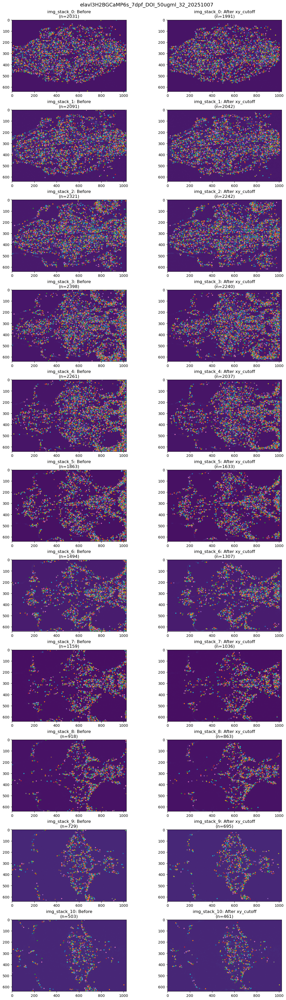

In [8]:
# Remove ROIs at the borders
xy_cutoff = 20  
    
good_rois = remove_xy(fish, xy_cutoff=xy_cutoff)

Batch exists. Loading batch.pickle


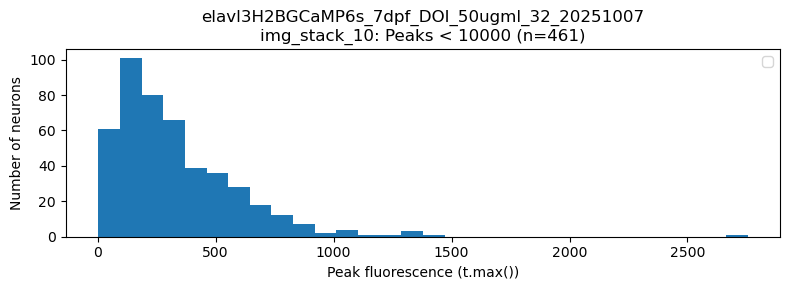

In [9]:
# Look at the distribution of temporal peak values per plane
# Change the peak_cutoff to visualize distributions with lower fluorescence values

plane = 10  # pick a plane where you think there are more ROIs with low fluorescence
peak_cutoff = 10000  # maximum peak fluorescence value

name = f'img_stack_{plane}'
mes_df = uuid_to_plane(load_mesmerize(fish))
row = mes_df[(mes_df.algo == 'cnmf') & (mes_df.item_name == name)].iloc[0]
# plot_t_distribution(row, good_rois[name], peak_cutoff=peak_cutoff)
plot_t_distribution(row, good_rois[name], peak_cutoff=peak_cutoff, exp_name=Path(exp_folder).name)

In [10]:
# plane = 10

# name = f'img_stack_{plane}'
# mes_df = uuid_to_plane(load_mesmerize(fish))
# row = mes_df[(mes_df.algo == 'cnmf') & (mes_df.item_name == name)].iloc[0]
# # plot_t_distribution(row, good_rois[name], peak_cutoff=peak_cutoff)
# plot_min_t_distribution(row, good_rois[name], exp_name=Path(exp_folder).name)


Batch exists. Loading batch.pickle
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/1316d7e2-2a34-4534-8909-dbc7cb7455a6/1316d7e2-2a34-4534-8909-dbc7cb7455a6-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/76e2b112-8f45-42c1-97fb-e2db2f73762a/76e2b112-8f45-42c1-97fb-e2db2f73762a-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/ff841307-dace-4609-b432-8cc9491df6c3/ff841307-dace-4609-b432-8cc9491df6c3-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/3dda5879-0360-4b8f-9772-3b343783571f/3dda5879-0360-4b8f-9772-3b343783571f-image_els__d1_640_d2_1024_d3_1_order_F_frames_160

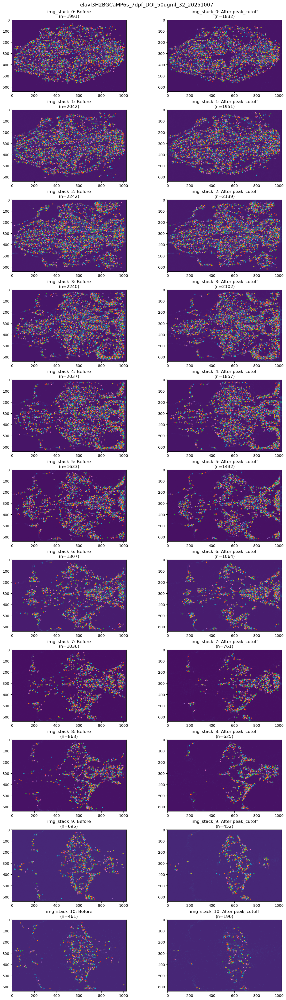

In [15]:
# Remove ROIs with small temporal peak values
peak_cutoff = 300

better_rois = remove_low_t(fish, indices=good_rois, peak_cutoff=peak_cutoff)

Batch exists. Loading batch.pickle
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/1316d7e2-2a34-4534-8909-dbc7cb7455a6/1316d7e2-2a34-4534-8909-dbc7cb7455a6-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/76e2b112-8f45-42c1-97fb-e2db2f73762a/76e2b112-8f45-42c1-97fb-e2db2f73762a-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/ff841307-dace-4609-b432-8cc9491df6c3/ff841307-dace-4609-b432-8cc9491df6c3-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/3dda5879-0360-4b8f-9772-3b343783571f/3dda5879-0360-4b8f-9772-3b343783571f-image_els__d1_640_d2_1024_d3_1_order_F_frames_160

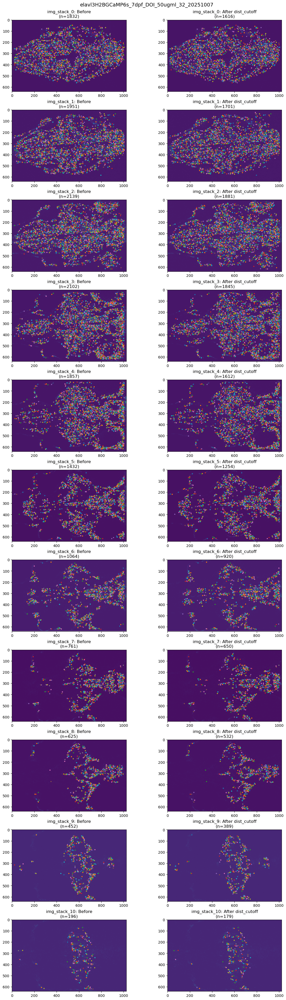

In [16]:
# Remove ROIs with close centers of mass 
# If any two ROIs have a center of mass within the dist_cutoff, the one with the lower peak fluorescence is eliminated
dist_cutoff = 6  # in pixels

best_rois = remove_close_dist(fish, indices=better_rois, dist_cutoff=dist_cutoff)

Batch exists. Loading batch.pickle


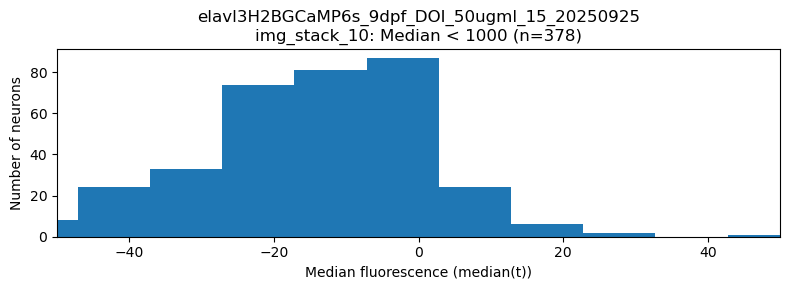

In [ ]:
# # Look at the distribution of average temporal values per plane
# plane = 10
# median_cutoff = 1000

# name = f'img_stack_{plane}'
# mes_df = uuid_to_plane(load_mesmerize(fish))
# row = mes_df[(mes_df.algo == 'cnmf') & (mes_df.item_name == name)].iloc[0]

# plot_med_t_distribution(row, even_better_rois[name], median_cutoff=median_cutoff, exp_name=Path(exp_folder).name, xlim = (-50, 50))

now get rid of high averages but plotting those with high averages to confirm that it's just skin.

Batch exists. Loading batch.pickle
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/mesmerize-batch/1a515408-b1e7-430a-af0e-5eea916c3c59/1a515408-b1e7-430a-af0e-5eea916c3c59-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/mesmerize-batch/00ff7dc0-687e-459e-a8ba-d646c0fa5786/00ff7dc0-687e-459e-a8ba-d646c0fa5786-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/mesmerize-batch/0124b8df-1f13-4be9-b22d-0a8ea655296d/0124b8df-1f13-4be9-b22d-0a8ea655296d-image_els__d1_640_d2_1024_d3_1_order_F_frames_1606.mmap
Decode mmap filename /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/mesmerize-batch/6658a75d-3483-48cb-bf33-3e026a38a6d1/6658a75d-3483-48cb-bf33-3e026a38a6d1-image_els__d1_640_d2_1024_d3_1_order_F_frames_160

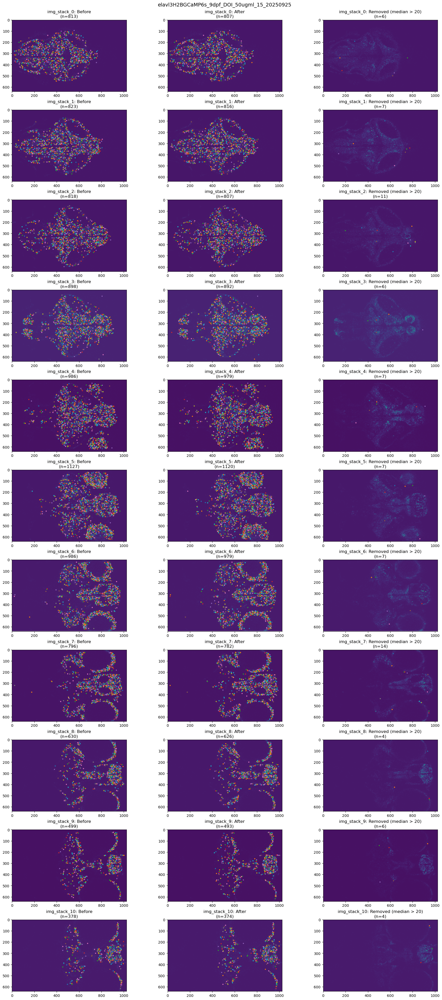

In [ ]:
# # Remove ROIs with high median fluorescence (e.g. skin)
# median_cutoff = 20  # tune as needed; ROIs with median fluorescence above this are removed

# best_rois = remove_high_med_t(fish, indices=even_better_rois, median_cutoff=median_cutoff)

In [17]:
# Create a dictionary of final ROIs
final_rois = best_rois.copy()

# Save the final ROIs under mesmerize-batch/final_rois.pickle
save_rois(fish, final_rois)

Final ROIs saved for elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007 -> /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_7dpf_DOI_50ugml_32_20251007/mesmerize-batch/final_rois.pickle
